## Estimating backfitting uncertainty via microstate-equivalent electric dipoles


In [4]:
import warnings
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import yaml

import meed_method_utils as u

warnings.filterwarnings("ignore")
plt.rcParams["figure.dpi"] = 120

JSON_PATH = "metamaps_export_lemon.json"
K = 4
RUN_FULL_DIPOLE = True
with open("config.yml", encoding="utf-8") as f:
    PROJECT_PATHS = yaml.safe_load(f)["paths"]
OUTDIR = Path(PROJECT_PATHS["results_root"]) / f"results-{K}-notebook-lemon"
OUTDIR.mkdir(parents=True, exist_ok=True)


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
# Keep all notebook outputs under the configured results root.
OUTDIR = Path(PROJECT_PATHS["results_root"]) / "results_method"
OUTDIR.mkdir(parents=True, exist_ok=True)
print(f"Method results directory: {OUTDIR}")

### 1. Microstate metamaps
We start from $M$ scalp maps, each with $N_{\mathrm{ch}}$ channels, analyze the map-space geometry, and then test whether the maps can be represented by a geometry-corrected fixed-center dipole model. Maps are written as columns:

$$
B =
\begin{bmatrix}
| & | & & | \\
b_1 & b_2 & \cdots & b_M \\
| & | & & |
\end{bmatrix}
\in
\mathbb{R}^{N_{\mathrm{ch}}\times M}
$$

where $b_m \in \mathbb{R}^{N_{\mathrm{ch}}}$.
Microstate maps are used through topographic correlation; for an EEG sample $x(t)$, the assigned microstate is:

$$
\hat m(t)
=
\arg\max_m
\operatorname{corr}\left(x(t), b_m\right)
$$

Therefore each map should be centered and L2-normalized:

$$
\tilde b_m
=
\frac{
b_m-\bar b_m\mathbf{1}
}{
\left\|b_m-\bar b_m\mathbf{1}\right\|
}
, \
\bar b_m
=
\frac{1}{N_{\mathrm{ch}}}
\sum_{i=1}^{N_{\mathrm{ch}}}b_{im}
, \
\|\tilde b_m\|=1
$$

The normalized map matrix is:

$$
\tilde B =
\begin{bmatrix}
| & | & & | \\
\tilde b_1 & \tilde b_2 & \cdots & \tilde b_M \\
| & | & & |
\end{bmatrix}
$$

Here we visualize all solutions and in particular for K=4 (the most commonly used) the difference in visualization when normalizing as required by the microstate backfitting procedure. 

B is channels x maps: (63, 4) with labels ['A', 'B', 'C', 'D']


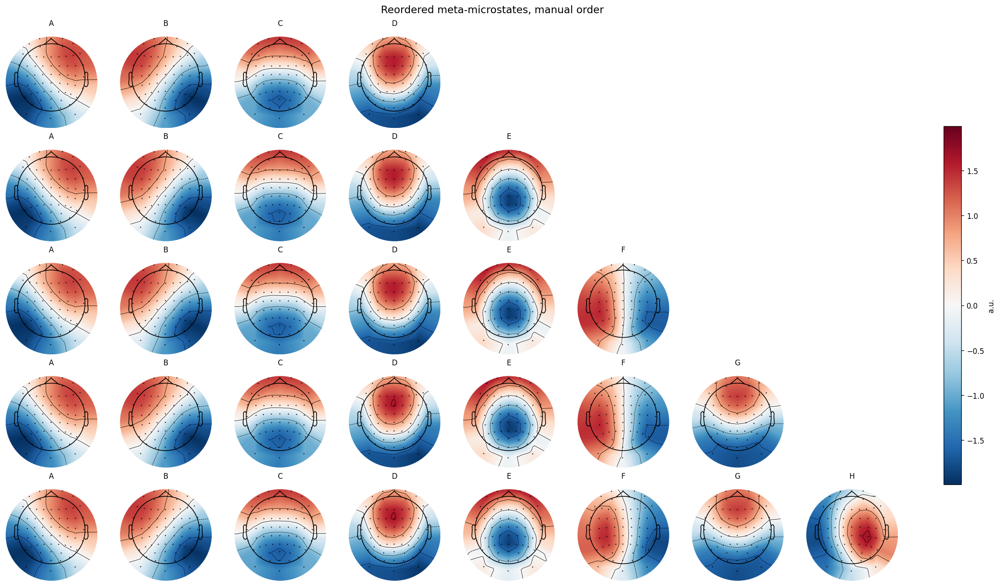

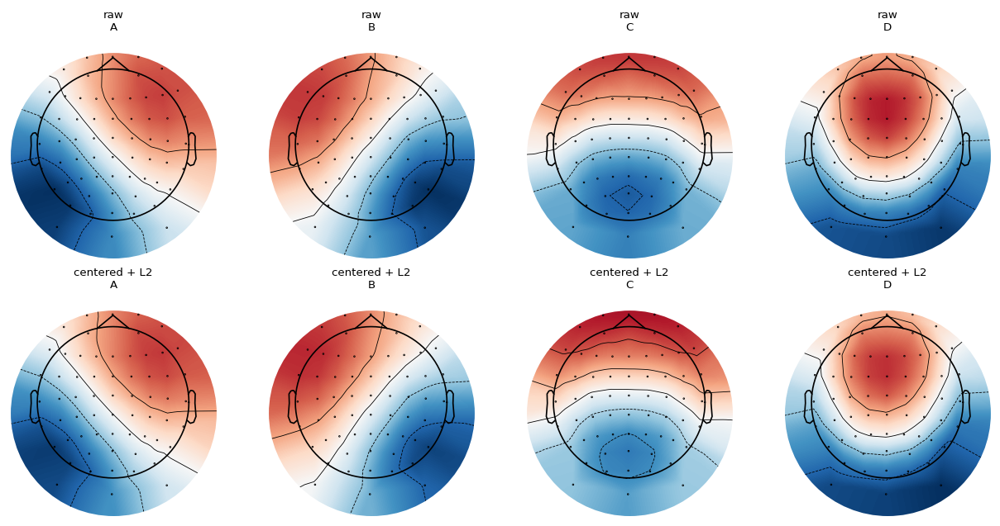

In [5]:

ds = u.load_microstates(JSON_PATH, K)
fig = u.plot_reordered_metamaps_all_k(ds, normalized=False)
fig.savefig(OUTDIR / "reordered_metamaps_all_k_raw.svg", bbox_inches="tight")
print(f"B is channels x maps: {ds['B'].shape} with labels {ds['labels']}")
fig = u.plot_raw_and_normalized(ds['raw'], ds['B'], ds['labels'], ds['info'])
B, ch_names, labels, info = ds['B'], ds['ch_names'], ds['labels'], ds['info']

### 2. Properties of the space induced by microstate maps
This section shows the properties of the maps $B$ when we interpret them as a non-orthogonal base, i.e. in maps terms where the maps are not independent and are correlated between them.


#### 2.1 Gram matrix
If we intepret microstates as a base, the correlation matrix between the four maps is also the Gram matrix:

$
G=
\tilde B^\top \tilde B
\in
\mathbb{R}^{M\times M}
$
and due to map normalization:
$
G_{mn}=\tilde b_m^\top \tilde b_n=\operatorname{corr}(b_m,b_n)
$

So $G$ is the pairwise topographic-correlation matrix. 
The report visualizes
$
\tilde B
$
as a channel-by-map matrix, then 
$
G
$
as a heatmap.

#### 2.2 Rank: the problem of correlation among maps

The map set has linear rank:
$
\operatorname{rank}(\tilde B)
$
and if:
$
\operatorname{rank}(\tilde B)=M
$
then the $M$ maps technically form a basis for an $M$-dimensional subspace of centered sensor space. However, being formally full-rank does not mean that all dimensions are stable. A nearly redundant direction can make the basis ill-conditioned.

Let: 
$
G=\tilde B^\top \tilde B=V\Lambda V^\top
$
with
$
\Lambda=\operatorname{diag}(\lambda_1,\ldots,\lambda_M)
$. 
If the smallest eigenvalue is tiny, the corresponding direction exists algebraically but is weak and unstable.
This effect is easier to understand when we try to go from $B$ to an actual orthogonal basis using the Gram procedure. When trying to obtain an orthogonal basis, the vectors we start from should be at most weakly correlated, or nearly orthogonal. Otherwise, small-eigenvalue direction will result in unstable maps due to redundancy. In 2.3 we check what happens when we try to begin with the Gram procedure.

#### 2.3 Gram whitening and redundancy

A Gram whitening transform is:
$
\tilde B_{\mathrm{white}}=\tilde B G^{-1/2}
$
 and gives: 
$
\tilde B_{\mathrm{white}}^\top
\tilde B_{\mathrm{white}}=I
$

This is algebraically valid when $G$ is full-rank. It is not necessarily a useful physiological transform when one eigenvalue is near zero. Since:
$
G^{-1/2}=V\Lambda^{-1/2}V^\top
$
a tiny $\lambda_i$ produces a large factor:
$
\frac{1}{\sqrt{\lambda_i}}.
$
Thus, Gram whitening amplifies near-redundant dimensions. 
Then, what is a more realistic rank?


#### 2.4 Effective rank


First method is the effective rank, which estimates how many dimensions are meaningfully used; starting from the spectral entropy 
$
H=-\sum_i p_i\log p_i
$, 
where 
$
p_i=\frac{\lambda_i}{\sum_j \lambda_j}
$
, then the entropy effective rank is:
$
r_{\mathrm{eff}}=
\exp(H)
$




#### 2.5 Participation ratio

The participation ratio is a complementary estimate of effective dimensionality:
$
r_{\mathrm{PR}}=
\frac{
\left(\sum_i\lambda_i\right)^2
}{
\sum_i\lambda_i^2
}
$



#### 2.6 Dimension as the number of maps increases

For each available map set size:
$
M=2,3,4,5,\ldots
$
the report computes
$
r_{\mathrm{eff}}(M)
$
and
$
r_{\mathrm{PR}}(M)
$

This tests whether dimensionality rises strongly from 2 to 3 maps, mildly from 3 to 4 maps, and then saturatesas expected from silhouette scores in literature.


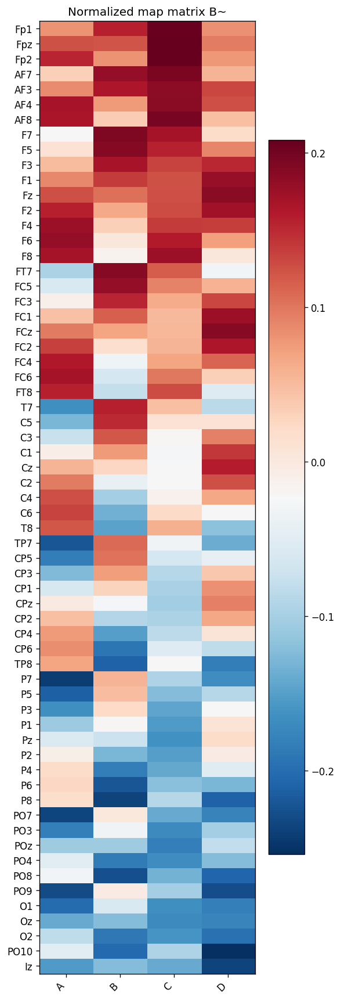

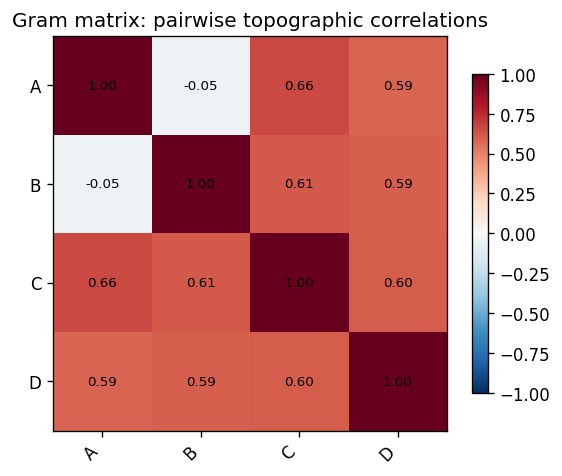

,0
metric,
n_maps,4.000000
n_channels,63.000000
rank,4.000000
n_tiny_eigenvalues,0.000000
condition_number_full,84469.128296
condition_number_nonzero_spectrum,84469.128296
effective_rank_entropy,2.385685
participation_ratio,2.064593
mean_abs_offdiag_corr,0.518504


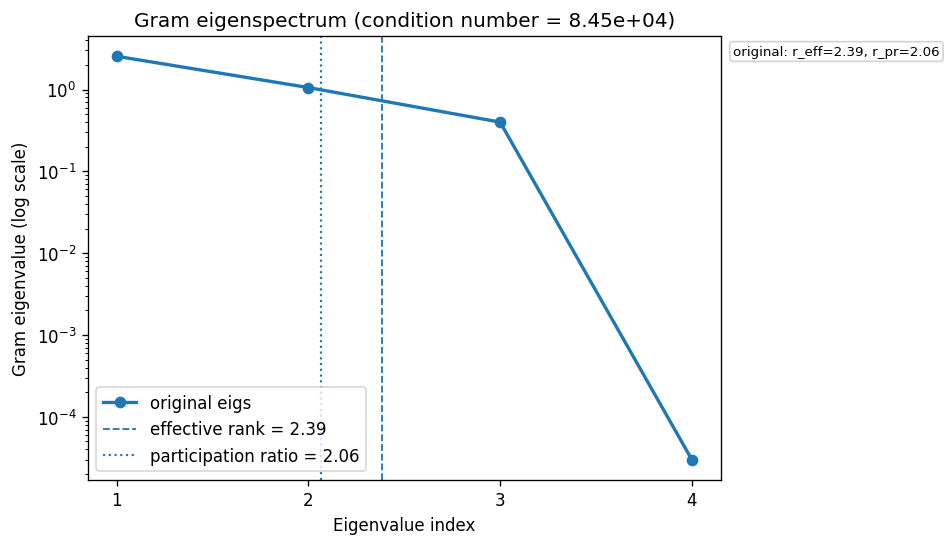

In [6]:
G, metrics, eig_df = u.gram_diagnostics(B)

fig = u.plot_matrix(B, ch_names, [u.pretty_label(x) for x in labels], title="Normalized map matrix B~")
fig = u.plot_gram_heatmap(G, labels)
plt.show()
display(metrics.rename_axis("metric").to_frame())
fig = u.plot_eigenspectrum(eig_df, metrics)

### 3. Microstate-equivalent electric dipole (MEED)

Microstate maps are topographies characterized by smooth, bipolar potentials; in other - physical - terms, this means we are looking for typical equipotential fields generated by a deep virtual electric dipole. 

Let $r_i\in\mathbb{R}^3$ be the MNE electrode coordinate. Let the fitted sphere have origin $c$ and radius $R$. Then:

$$
u_i
=
\frac{r_i-c}{R}
$$

Optionally, each $u_i$ is projected to the unit sphere:

$$
s_i
=
\frac{u_i}{\|u_i\|}
$$

The sensor-coordinate matrix is:

$$
S
=
\begin{bmatrix}
x_1 & y_1 & z_1 \\
x_2 & y_2 & z_2 \\
\vdots & \vdots & \vdots \\
x_{N_{\mathrm{ch}}} & y_{N_{\mathrm{ch}}} & z_{N_{\mathrm{ch}}}
\end{bmatrix}
\in
\mathbb{R}^{N_{\mathrm{ch}}\times 3}
$$

Because maps are centered, the coordinate basis is also centered:


$$
S_c
=
S-\mathbf{1}\bar S
$$


For a dipole fixed at the sphere center ($r=0$)
the idealized field on the sphere is
$
\hat b(s_i)=p^\top s_i
$,
where:
$$
p=
\begin{bmatrix}
p_x\\
p_y\\
p_z
\end{bmatrix}
\\
\text{or in matrix form:}
\\
\hat b
=
S_c p
$$

The columns of $S_c$ are not exactly orthonormal. Therefore:

$$
S_c^\top S_c \neq I
$$

Define the electrode-geometry metric:

$$
M_S
=
S_c^\top S_c
$$

Then:

$$
\|\hat b\|^2
=
p^\top M_S p
$$

So the normalized-map constraint implies:

$$
p^\top M_Sp=1
$$

which is an ellipsoid in raw $p$-coordinates.

We correct this by defining:

$$
S_{\mathrm{orth}}
=
S_c M_S^{-1/2}
$$

Then:

$$
S_{\mathrm{orth}}^\top S_{\mathrm{orth}}=I
$$

Now $S_{\mathrm{orth}}$ is an orthonormal geometry-corrected basis for the fixed-dipole subspace.

The projection is:

$$
Q
=
S_{\mathrm{orth}}^\top\tilde B
\in
\mathbb{R}^{3\times M}
$$

and the reconstruction is:

$$
\hat B_{\mathrm{dip}}
=
S_{\mathrm{orth}}Q
$$

Because $S_{\mathrm{orth}}$ is orthonormal:

$$
R_m^2
=
\|q_m\|^2
$$

where $q_m$ is the $m$-th column of $Q$.

The normalized direction is:

$$
u_m
=
\frac{q_m}{\|q_m\|}
$$

and gives a two-dimensional angular representation:

$$
D_m=(\theta_m,\phi_m)
$$

where:

$$
D
\in
\mathbb{R}^{2\times M}
$$

In short, since the actual surface the electrodes lie on is an ellipsoid, we apply a correction:

$$
S_{\mathrm{orth}} = S_c M_S^{-1/2},\quad S_{\mathrm{orth}}^\top S_{\mathrm{orth}} = I
$$

$$
Q = S_{\mathrm{orth}}^\top \tilde B, \quad \hat B_{\mathrm{dip}} = S_{\mathrm{orth}}Q, \quad R_m^2 = \|q_m\|^2
$$

The fixed MEED projection is:

$$
q_m=S_{\mathrm{orth}}^\top \tilde b_m
$$

with:

$$
q_m=\rho_m u_m
$$

Here $\rho_m=\|q_m\|$ is dipolarity and $\rho_m^2$ is the projection $R^2$. It is not a retained coordinate. The retained fixed MEED representation is only:

$$
D_m=(\theta_m,\phi_m)
$$

and the corresponding unit fixed-dipole template is:

$$
\hat b_m^{\mathrm{MEED}}=S_{\mathrm{orth}}u_m
$$

The full dipole model is more flexible because location is also fit. It is a diagnostic comparison, not the target representation.

,sphere_radius_m,sphere_origin_x_m,sphere_origin_y_m,sphere_origin_z_m,M_condition,S_orth_residual_fro
0,0.096382,-0.000814,0.014035,0.042914,2.750442,1.221755e-15


,label,theta_deg,phi_deg,dipolarity,projection_R2,R2
0,A,44.053181,6.940631,0.995914,0.991844,0.991828
1,B,-48.681305,-0.450670,0.994916,0.989858,0.989832
2,C,1.464695,-16.823206,0.998816,0.997634,0.997632
3,D,-6.130269,35.291236,0.995719,0.991456,0.991438


,label,loc_azimuth_anat_deg,loc_elevation_deg,moment_azimuth_anat_deg,moment_elevation_deg,R2
0,A,62.990075,4.191428,45.472872,9.342155,0.999170
1,B,-39.002775,6.541503,-50.156117,-3.178899,0.998775
2,C,7.854232,6.986431,1.402089,-26.431820,0.998364
3,D,28.703322,-40.637183,-7.178187,51.754174,0.993491


,label,MEED_theta_phi_R2,MEED_projection_R2_diagnostic,full_dipole_R2
0,A,0.991828,0.991844,0.999170
1,B,0.989832,0.989858,0.998775
2,C,0.997632,0.997634,0.998364
3,D,0.991438,0.991456,0.993491


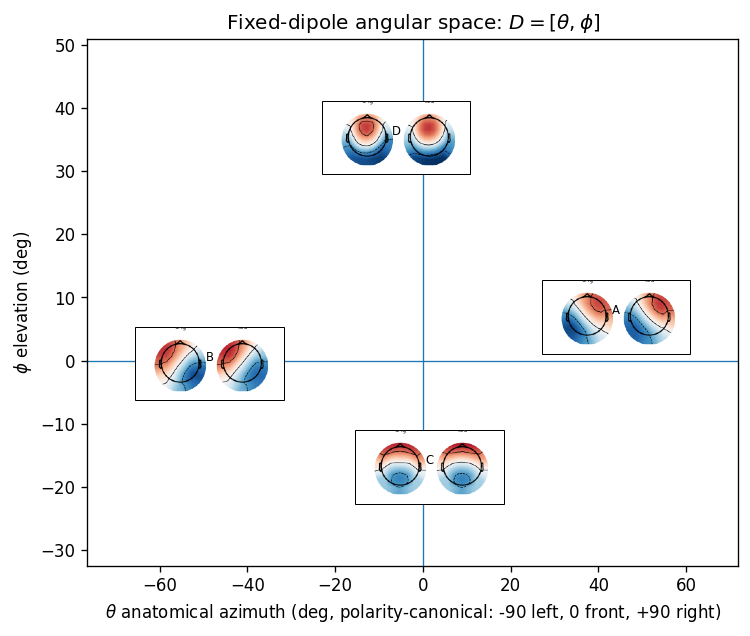

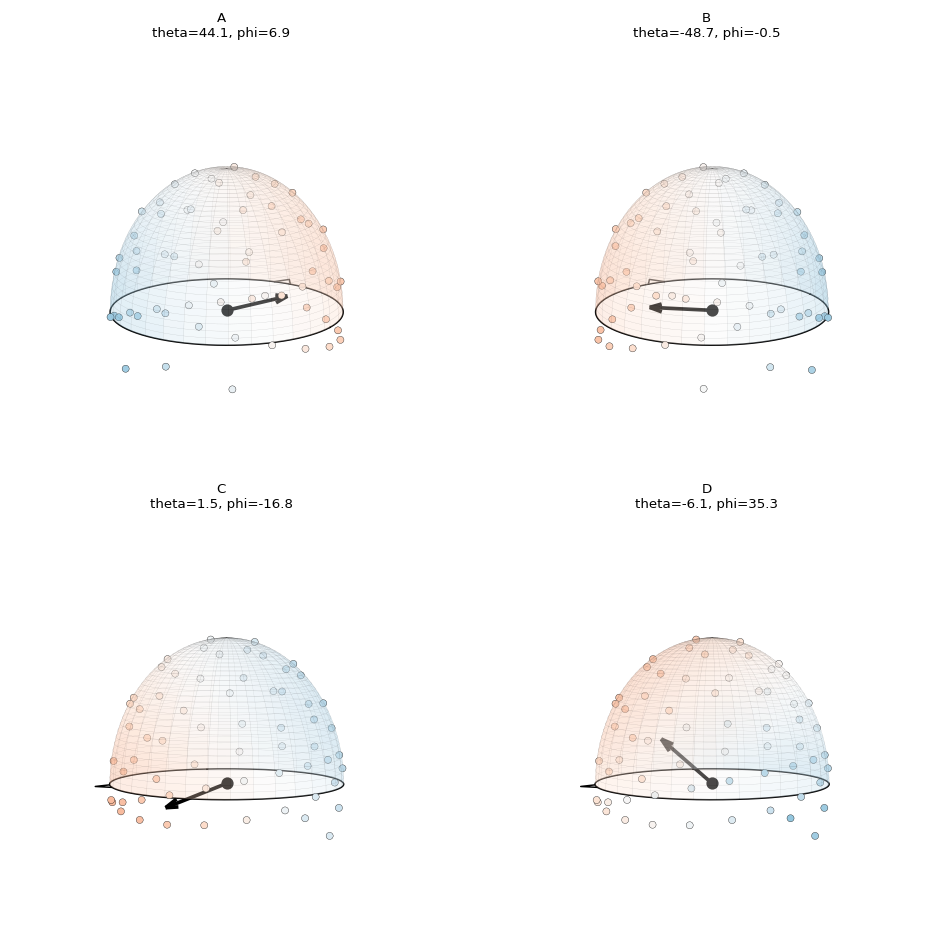

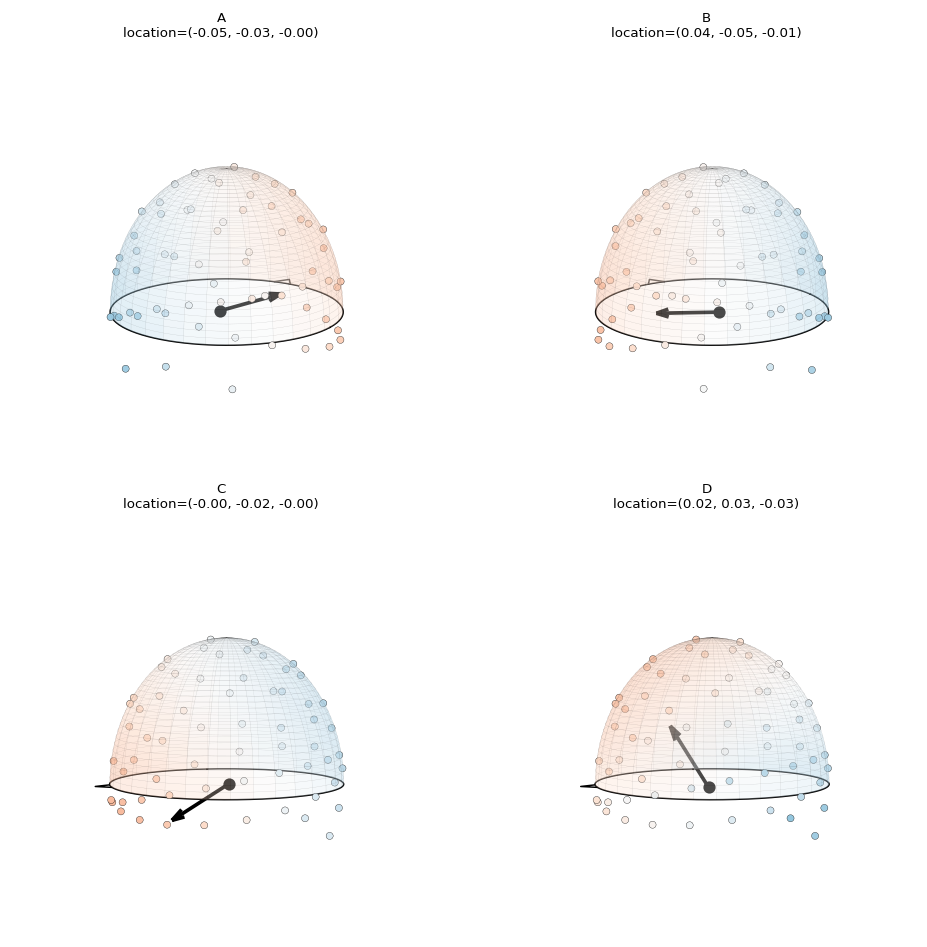

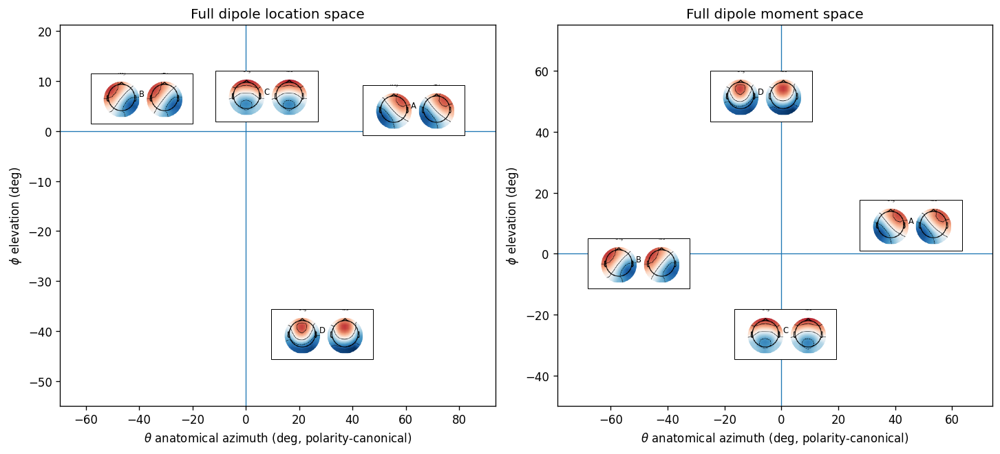

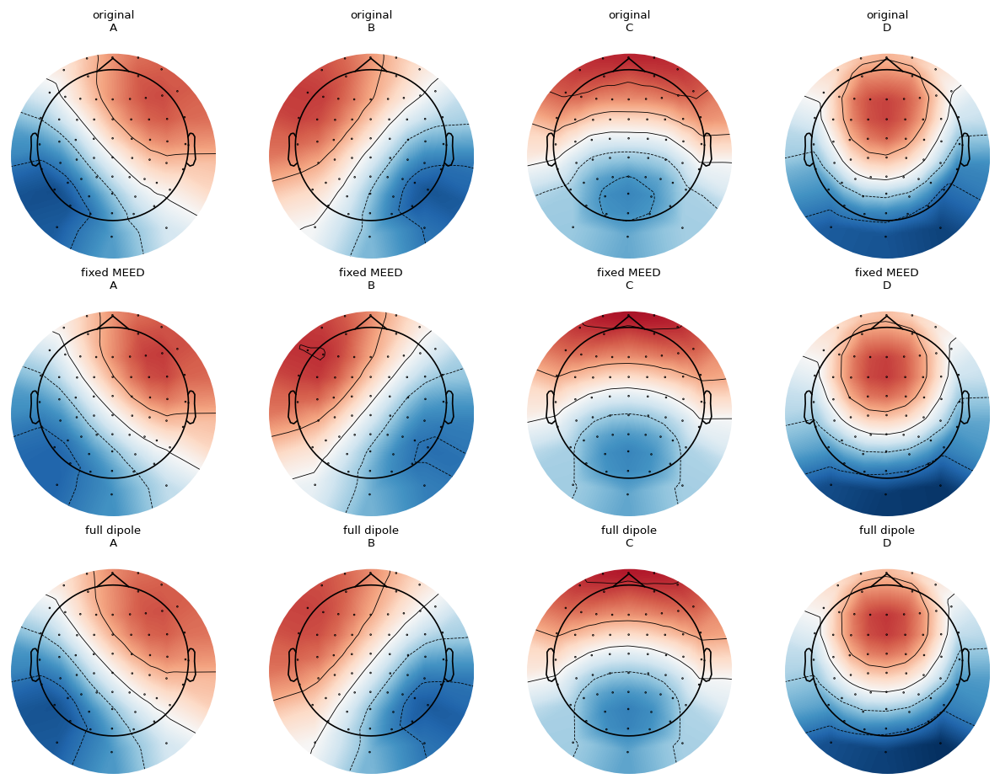

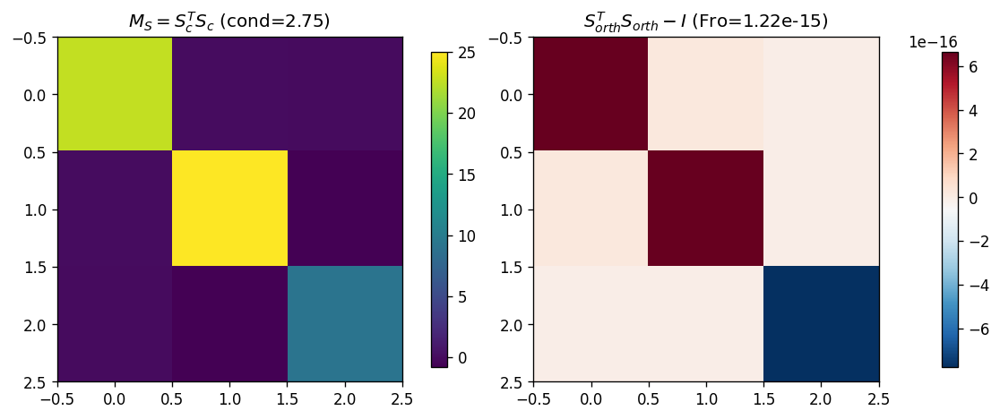

In [24]:
geom = u.sensor_geometry(info)

geometry_df = pd.DataFrame([{
    "sphere_radius_m": geom["radius_m"],
    "sphere_origin_x_m": geom["origin_m"][0],
    "sphere_origin_y_m": geom["origin_m"][1],
    "sphere_origin_z_m": geom["origin_m"][2],
    "M_condition": geom["M_condition"],
    "S_orth_residual_fro": geom["S_orth_residual_fro"],
}])
display(geometry_df)

Q, Bfixed_proj, Bmeed, fixed_df = u.project_fixed_dipole(B, geom["S_orth"])
fixed_df["label"] = labels

Bfull, full_df = u.fit_full_dipole(B, geom["S"], fast=True, seed=1)
full_df["label"] = labels

model_df = pd.DataFrame({
    "label": labels,
    "MEED_theta_phi_R2": fixed_df["R2"],
    "MEED_projection_R2_diagnostic": fixed_df["projection_R2"],
})
if full_df is not None:
    model_df["full_dipole_R2"] = full_df["R2"]

display(fixed_df[["label", "theta_deg", "phi_deg", "dipolarity", "projection_R2", "R2"]])
display(full_df[["label", "loc_azimuth_anat_deg", "loc_elevation_deg", "moment_azimuth_anat_deg", "moment_elevation_deg", "R2"]])
display(model_df)

fig = u.plot_fixed_space(B, Bmeed, labels, fixed_df, info)
# plt.switch_backend("qtagg")
# plt.ion()
fig = u.plot_dipole_sphere(B, labels, fixed_df, geom["S"], elev=60, azim=140)
axes3d = fig.get_axes()
axes3d[0].view_init(elev=15, azim=-60) # A
axes3d[1].view_init(elev=15, azim=-120) # B
axes3d[2].view_init(elev=6, azim=170) # C
axes3d[3].view_init(elev=6, azim=170) # D
fig.savefig(OUTDIR / "fixed_dipole_sphere.svg", bbox_inches="tight")

fig = u.plot_full_dipole_sphere(B, labels, full_df, geom["S"], elev=60, azim=140)
axes3d = fig.get_axes()
axes3d[0].view_init(elev=15, azim=-60) # A
axes3d[1].view_init(elev=15, azim=-120) # B
axes3d[2].view_init(elev=6, azim=170) # C
axes3d[3].view_init(elev=6, azim=170) # D
# plt.show(block=True)
# plt.ioff()
# %matplotlib inline
fig.savefig(OUTDIR / "full_dipole_sphere.svg", bbox_inches="tight")

fig = u.plot_full_dipole_space(B, Bfull, labels, full_df, info)
fig = u.plot_fixed_full_reconstruction_gallery(B, Bmeed, Bfull, labels, info)

fig = u.plot_geometry(geom)

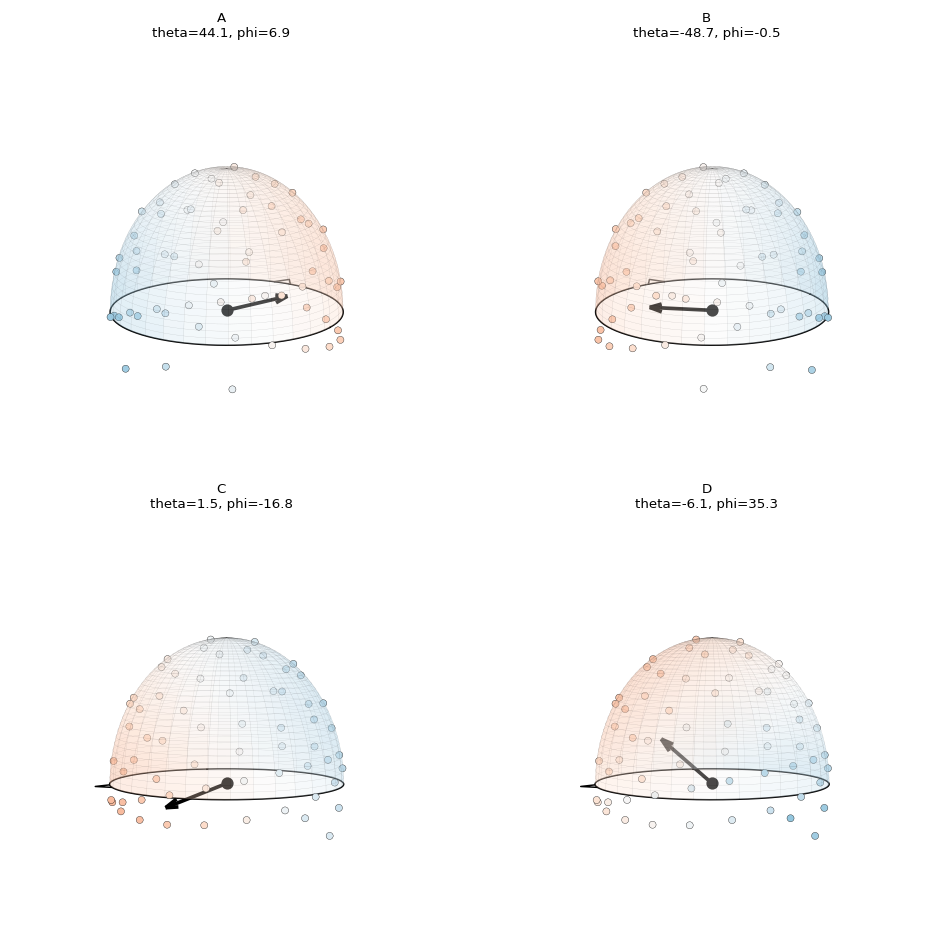

In [8]:

fig = u.plot_dipole_sphere(B, labels, fixed_df, geom["S"], elev=60, azim=140)
axes3d = fig.get_axes()
axes3d[0].view_init(elev=15, azim=-60) # A
axes3d[1].view_init(elev=15, azim=-120) # B
axes3d[2].view_init(elev=6, azim=170) # C
axes3d[3].view_init(elev=6, azim=170) # D
fig.savefig(OUTDIR / "fixed_dipole_sphere.svg", bbox_inches="tight")

### 6. Reconstruction quality across all map counts

The old reconstruction-gallery plot is removed. Reconstruction quality is now shown as spider plots. Each polygon has as many edges as maps in that solution. Fixed MEED and full dipole are superimposed for every available $M$.

This asks: when the number of selected maps changes, does the fixed two-angle MEED representation remain close enough to the original maps, and how much does the flexible full dipole improve?

M                       4                      5                      6  \
representation fixed_MEED full_dipole fixed_MEED full_dipole fixed_MEED   
label                                                                     
A                0.991828    0.999170   0.991836    0.999170   0.991828   
B                0.989832    0.998775   0.989832    0.998779   0.990797   
C                0.997632    0.998364   0.997529    0.998204   0.997528   
D                0.991438    0.993491   0.991388    0.993473   0.991412   
E                     NaN         NaN   0.994604    0.997629   0.994604   
F                     NaN         NaN        NaN         NaN   0.967808   
G                     NaN         NaN        NaN         NaN        NaN   
H                     NaN         NaN        NaN         NaN        NaN   

M                                   7                      8              
representation full_dipole fixed_MEED full_dipole fixed_MEED full_dipole  
label                                                                     
A                 0.999169   0.991828    0.999171   0.991828    0.999171  
B                 0.998808   0.990784    0.998808   0.990726    0.998810  
C                 0.998204   0.997341    0.998134   0.997341    0.998133  
D                 0.993487   0.989958    0.992277   0.989958    0.992277  
E                 0.997629   0.994669    0.997717   0.994772    0.997664  
F                 0.996519   0.967808    0.996519   0.972618    0.995756  
G                      NaN   0.995489    0.996801   0.995489    0.996801  
H                      NaN        NaN         NaN   0.969125    0.990122

M;4;4;5;5;6;6;7;7;8;8
representation;fixed_MEED;full_dipole;fixed_MEED;full_dipole;fixed_MEED;full_dipole;fixed_MEED;full_dipole;fixed_MEED;full_dipole
label;;;;;;;;;;
A;0.9918277711370429;0.9991697608802536;0.9918358783927482;0.9991698568048287;0.9918280791839407;0.9991694599160995;0.9918277676570048;0.9991708252531539;0.9918277680683567;0.9991708252590967
B;0.9898317462915515;0.9987748668835909;0.9898323430328071;0.998778539527793;0.9907973809411772;0.9988083897099469;0.9907839635641006;0.998808460589531;0.990726316140921;0.9988098425746593
C;0.9976323266311194;0.9983640836381302;0.9975291142527252;0.9982039056819019;0.9975282922435897;0.9982035084139086;0.9973408942261762;0.9981340863123718;0.9973414826843671;0.9981334785888525
D;0.9914376729176876;0.993490845971868;0.9913881675190148;0.9934734005228876;0.9914123759397868;0.9934869499244489;0.9899577966805831;0.992277079037417;0.9899577967233054;0.9922770792614168
E;;;0.9946039887423583;0.9976290873431268;0.9946039869495313;0.997629

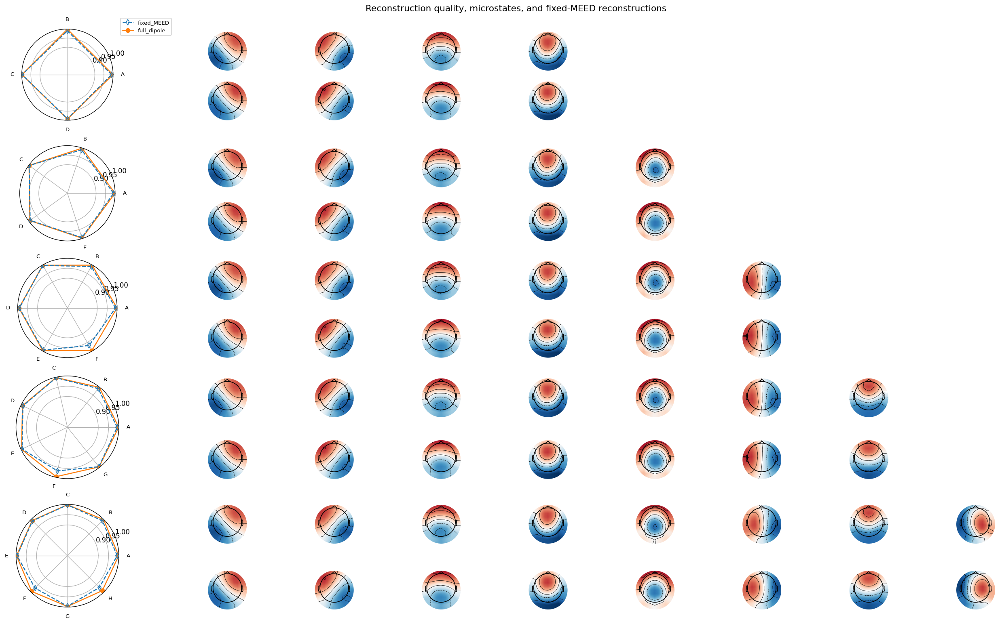

In [22]:
r2_all = u.reconstruction_quality_all_m(ds["all_sets"], fast_full=True, seed=1)

r2_table = r2_all.pivot_table(
    index="label",
    columns=["M", "representation"],
    values="R2",
    aggfunc="mean",
)
display(r2_table)
print(r2_table.to_csv(sep=";"))

#fig = u.plot_reconstruction_spiders_all_m(r2_all)
fig = u.plot_reconstruction_spiders_with_metamaps_all_m(ds, r2_all)

### 7. Geometry preservation for the 4-map set

Effective rank, participation ratio, and between-map correlations are properties of maps in sensor space. Therefore they must be recomputed on reconstructed topographies, not on the coordinate matrix $D=[\theta,\phi]$.

If MEED has high $R^2$, the reconstructed map geometry should be close to the original. If the Gram geometry changes strongly, MEED is not a faithful expression of the selected maps.

,index,representation,mean,min,max,std
0,0,MEED_theta_phi,0.992682,0.989832,0.997632,0.003411
1,1,full_dipole,0.997450,0.993491,0.999170,0.002660


,representation,map_index,label,R2
0,MEED_theta_phi,0,A,0.991828
1,MEED_theta_phi,1,B,0.989832
2,MEED_theta_phi,2,C,0.997632
3,MEED_theta_phi,3,D,0.991438
4,full_dipole,0,A,0.999170
5,full_dipole,1,B,0.998775
6,full_dipole,2,C,0.998364
7,full_dipole,3,D,0.993491


,representation,fro_error,fro_error_rel,mean_abs_diff_offdiag,max_abs_diff_offdiag,upper_triangle_corr
0,MEED_theta_phi,0.013996,0.005027,0.003806,0.006350,0.999996
1,full_dipole,0.008420,0.003024,0.001449,0.005734,0.999967


effective_rank_entropy                        \
representation   fixed_MEED_theta_phi full_dipole  original   
M                                                             
4                            2.377031    2.385154  2.385685   
5                            2.626945    2.644570  2.643824   
6                            2.764909    2.790823  2.792805   
7                            2.692235    2.718678  2.724788   
8                            2.797007    2.828625  2.833205   

                participation_ratio                        
representation fixed_MEED_theta_phi full_dipole  original  
M                                                          
4                          2.054250    2.059787  2.064593  
5                          2.335956    2.343433  2.348714  
6                          2.593018    2.600172  2.605225  
7                          2.459163    2.466143  2.472439  
8                          2.643251    2.648679  2.655220

space,MEED_theta_phi,full_dipole,original
metric,,,
condition_number,inf,2236.351447,84469.128295
condition_number_full,inf,2236.351447,84469.128295
condition_number_nonzero_spectrum,6.472099,2236.351447,84469.128295
declared_intrinsic_dimension,2.000000,NaN,NaN
effective_rank_entropy,2.377031,2.385154,2.385685
max_abs_offdiag_corr,0.664586,0.661636,0.661724
mean_abs_offdiag_corr,0.520193,0.519828,0.518504
n_channels,63.000000,63.000000,63.000000
n_maps,4.000000,4.000000,4.000000


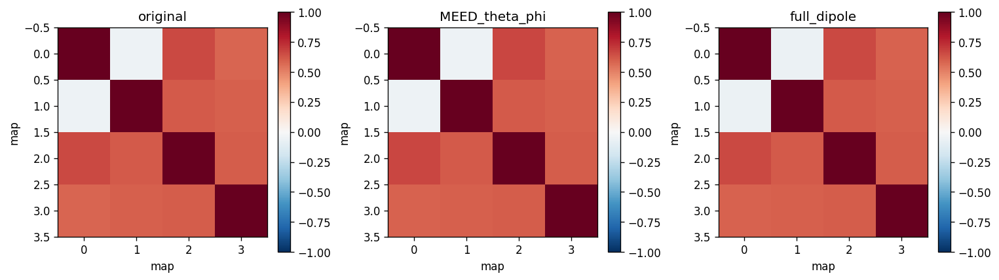

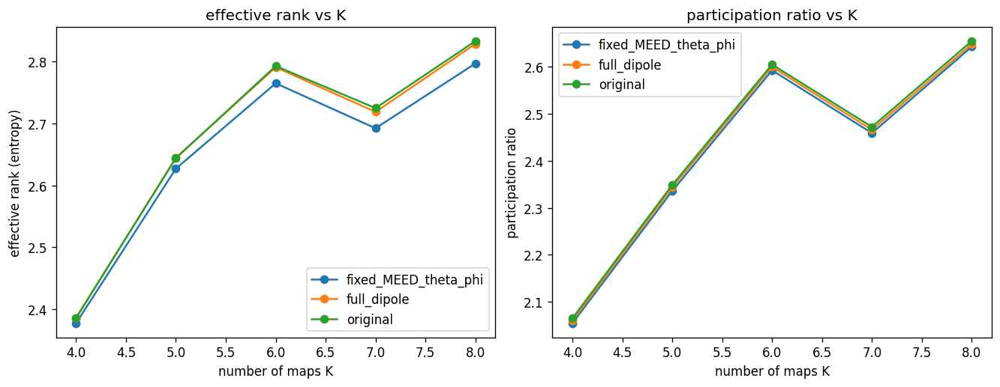

In [10]:
recons = {"MEED_theta_phi": Bmeed}
if Bfull is not None:
    recons["full_dipole"] = Bfull

r2_summary, r2_long = u.reconstruction_r2_table(B, recons, labels=labels)
gram_summary = u.gram_preservation_table(B, recons)

display(r2_summary)
display(r2_long)
display(gram_summary)

fig = u.plot_gram_preservation(B, recons)

dim_models_df = u.effective_dimension_by_m_models(ds["all_sets"], fast_full=True, seed=1)
dim_models_table = dim_models_df.pivot_table(
    index="M",
    columns="representation",
    values=["effective_rank_entropy", "participation_ratio"],
    aggfunc="mean",
)
display(dim_models_table)

fig = u.plot_dimension_by_m_models(dim_models_df)

spaces = {"original": B}
spaces.update(recons)
transform_df = u.transformed_space_diagnostics(
    spaces,
    intrinsic_dims={"MEED_theta_phi": 2}
)
display(u.metric_table_wide(transform_df))

### 8. Leave-one-electrode sensitivity for fixed and full dipoles

This test asks how dependent the fitted representation is on individual electrodes.

For fixed MEED, dropping one electrode changes only the estimated angular direction. Large angular changes mean the two-angle representation is not stable under small montage perturbations.

For full dipole, dropping one electrode can change moment direction, source location, and $R^2$. This is important because the full dipole is more flexible: high fit quality is less useful if the fitted source moves substantially when one electrode is removed.

[leave-one-electrode] rows=504


,model,label,delta_theta_mean_deg,delta_theta_max_deg,delta_phi_mean_deg,delta_phi_max_deg,stereo_angle_mean_deg,stereo_angle_max_deg,R2_change_mean,abs_R2_change_max,loc_shift_x_abs_mean,loc_shift_y_abs_mean,loc_shift_z_abs_mean,loc_shift_norm_mean,loc_shift_norm_max
0,fixed_MEED,A,0.279923,0.785236,0.253723,1.100613,0.412489,1.128809,-0.000459,0.002196,NaN,NaN,NaN,NaN,NaN
1,fixed_MEED,B,0.279458,0.650342,0.252290,1.157326,0.415135,1.209007,-0.000472,0.001698,NaN,NaN,NaN,NaN,NaN
2,fixed_MEED,C,0.345026,0.943261,0.252973,0.650228,0.456269,1.037477,-0.000390,0.001185,NaN,NaN,NaN,NaN,NaN
3,fixed_MEED,D,0.435720,1.641592,0.273689,0.776418,0.496544,1.378348,-0.000465,0.003073,NaN,NaN,NaN,NaN,NaN
4,full_dipole,A,0.023205,0.119253,0.031350,0.194445,0.041429,0.227295,-0.000403,0.002062,0.000283,0.000264,0.000273,0.000545,0.001957
5,full_dipole,B,0.028896,0.125589,0.045066,0.256005,0.056547,0.274390,-0.000403,0.001884,0.000371,0.000326,0.000403,0.000729,0.002269
6,full_dipole,C,0.034799,0.170138,0.052246,0.287372,0.065138,0.325349,-0.000383,0.001267,0.000392,0.000420,0.000536,0.000898,0.003104
7,full_dipole,D,0.097509,0.612160,0.084962,0.446096,0.112829,0.577443,-0.000441,0.002440,0.000780,0.000688,0.001137,0.001756,0.010578


,model,label,map_index,dropped_electrode,delta_theta_deg,delta_phi_deg,stereo_angle_deg,R2_change,loc_shift_x,loc_shift_y,loc_shift_z,loc_shift_norm
0,fixed_MEED,A,0,0,0.417614,0.300990,0.512190,-0.000149,NaN,NaN,NaN,NaN
1,full_dipole,A,0,0,0.080726,0.147977,0.168062,-0.000054,-0.001209,0.000330,-0.000923,0.001556
2,fixed_MEED,A,0,1,0.494567,0.409492,0.639136,-0.000506,NaN,NaN,NaN,NaN
3,full_dipole,A,0,1,0.043728,0.066772,0.079502,-0.000296,-0.000558,0.000655,-0.000794,0.001171
4,fixed_MEED,A,0,2,0.401664,0.573107,0.698020,-0.000834,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
499,full_dipole,D,3,60,0.002384,0.008035,0.008170,-0.001433,0.000037,-0.000076,0.000083,0.000119
500,fixed_MEED,D,3,61,0.920327,0.285052,0.804691,-0.003073,NaN,NaN,NaN,NaN
501,full_dipole,D,3,61,0.412563,0.433724,0.502706,-0.002440,0.004382,-0.001439,-0.009519,0.010578
502,fixed_MEED,D,3,62,0.209317,0.092912,0.194393,-0.001973,NaN,NaN,NaN,NaN


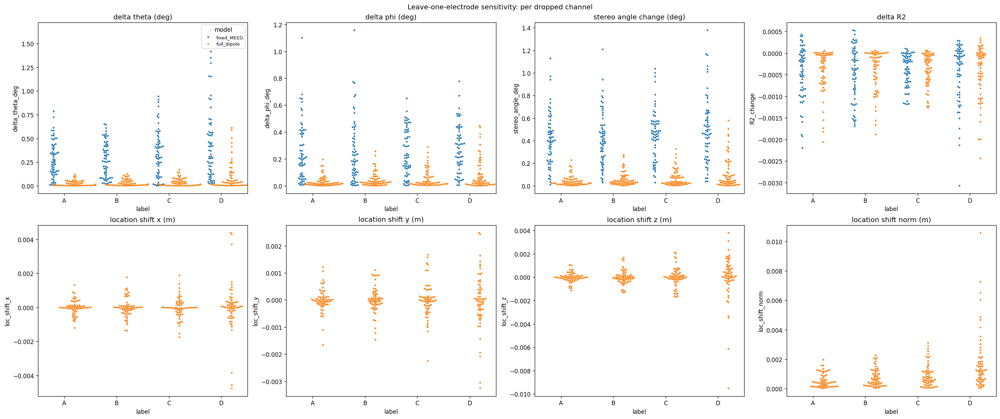

In [11]:
if try_skip:= True and (OUTDIR / "loco_sensitivity.csv").exists():
    print("Loading existing sensitivity results...")
    sens_df = pd.read_csv(OUTDIR / "loco_sensitivity.csv")
else:
    sens_df = u.fixed_and_full_leave_one_electrode_sensitivity(
        B=B,
        labels=labels,
        S=geom["S"],
        fast_full=True,
        seed=1,
        verbose=True,
    )
    sens_df.to_csv(OUTDIR / "loco_sensitivity.csv", index=False)

sens_summary = u.summarize_electrode_sensitivity(sens_df)
sens_table = u.leave_one_electrode_metrics_table(sens_df)

display(sens_summary)
display(sens_table)

fig = u.plot_leave_one_electrode_swarms(sens_df)


### 9. Null simulations for fixed and full dipoles

The null simulation asks what each model fits when the input is not a canonical microstate-like map.

Fixed MEED is strict: it measures first-order dipolar structure. Full dipole is flexible: it may fit random or high-order maps more easily because it can move the source location. Therefore, a high full-dipole $R^2$ alone is not sufficient evidence that a map is microstate-like.

Null types used in this notebook:

- `iid_random`: pure channel-wise random noise map (Gaussian entries), then centered and normalized. This has no spatial smoothness by construction.
- `low_order_l1_l2`: smooth map generated from low spherical-harmonic orders ($l=1,2$) plus small noise. This is intentionally dipole-like / broad-scale.
- `high_order_l3_l4`: map generated from higher spherical-harmonic orders ($l=3,4$) plus small noise. This emphasizes finer spatial structure and is less dipole-like.

How to read the result:

- Fixed MEED $R^2$ should be low for `iid_random` and typically lower for `high_order_l3_l4`.
- Fixed MEED $R^2$ should be higher for `low_order_l1_l2`.
- Full dipole can remain comparatively high across nulls because location is optimized, so the fixed-vs-full gap is the key diagnostic.


mean       std       min       max
kind             model                                              
high_order_l3_l4 fixed_MEED  -0.725699  0.105525 -0.930173 -0.478815
                 full_dipole  0.116542  0.131517 -0.154773  0.391574
iid_random       fixed_MEED  -0.636623  0.167584 -0.923809 -0.089362
                 full_dipole -0.138564  0.140300 -0.383779  0.298551
low_order_l1_l2  fixed_MEED   0.344684  0.401397 -0.895469  0.934836
                 full_dipole  0.738979  0.192409  0.242101  0.990598

,kind,n_pairs,mean_fixed_R2,mean_full_R2,mean_diff_full_minus_fixed,ttest_t,ttest_p,wilcoxon_W,wilcoxon_p
0,high_order_l3_l4,50,-0.725699,0.116542,0.842241,37.502532,9.510665e-38,0.0,1.776357e-15
1,iid_random,50,-0.636623,-0.138564,0.498058,20.118436,2.489876e-25,0.0,1.776357e-15
2,low_order_l1_l2,50,0.344684,0.738979,0.394295,12.002400,3.356016e-16,0.0,1.776357e-15


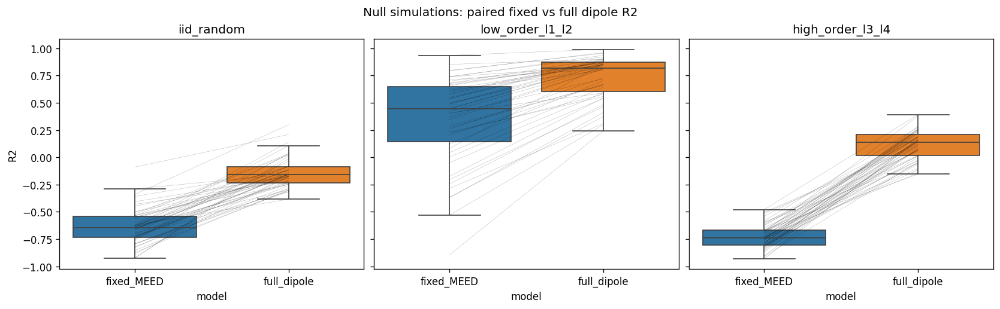

In [12]:

if try_skip_null:= True and (OUTDIR / "null_simulations.csv").exists() and (OUTDIR / "null_maps.csv").exists():
    print("Loading existing null simulation results...")
    null_both_df = pd.read_csv(OUTDIR / "null_simulations.csv")
    null_maps_df = pd.read_csv(OUTDIR / "null_maps.csv")
else:
    null_both_df, null_maps_df = u.null_simulations_fixed_and_full(
        S_orth=geom["S_orth"],
        S=geom["S"],
        n=50,
        seed=1,
        fast_full=True,
        return_maps=True,
    )
    null_both_df.to_csv(OUTDIR / "null_simulations.csv", index=False)
    null_maps_df.to_csv(OUTDIR / "null_maps.csv", index=False)

display(null_both_df.groupby(["kind", "model"])["R2"].agg(["mean", "std", "min", "max"]))

paired_tests = u.null_paired_r2_tests(null_both_df)
display(paired_tests)

fig = u.plot_null_paired_r2(null_both_df)

fig = u.plot_null_exemplary_maps_by_fixed_r2(null_maps_df, info=info, rows=7, cols_per_kind=4)
plt.savefig(OUTDIR / "null_exemplary_maps_by_fixed_r2.svg", bbox_inches="tight")

### 10. Previous-literature MEED analysis

The method analyses above use the microstate export JSON. This additional block uses only the MS Template Explorer `DistMat` MATLAB export, `metamaps_struct_lemon.mat`, to reproduce the previous-literature MEED visualizations: the MEED/MDS comparison, study topomap layout, angle-template grid, and the linked interactive 3D antipodal-dipole view across every available clustering solution. All saved SVG outputs are written to `results_method`.


In [ ]:
from IPython.display import SVG, display

PREVIOUS_LITERATURE_MAT = Path("metamaps_struct_lemon.mat")
previous_outputs = u.save_previous_literature_outputs(
    PREVIOUS_LITERATURE_MAT,
    OUTDIR,
    k=K,
)

for output_path in previous_outputs.values():
    display(SVG(filename=str(output_path)))